In [ ]:
#!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=c6c75fcb20ed863ce7bf5d2fde2817bd91df231d5746f589cbfad6480d9e3a0c
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


**Importing the required libraries for further implementation and analysis.**



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import (
    cross_val_score, train_test_split, GridSearchCV,
    StratifiedShuffleSplit, RandomizedSearchCV, StratifiedKFold
)
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    confusion_matrix, classification_report,
    roc_auc_score, precision_recall_curve
)
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

from imblearn.over_sampling import SMOTE

from xgboost import XGBClassifier, plot_importance

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from scipy.stats import chi2_contingency

import shap
import lime
import lime.lime_tabular

import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import Model

import investigate #make sure to have the library installed

tf.compat.v1.disable_eager_execution()

**Reading and merging the datasets.**

In [ ]:
df1 = pd.read_csv('dataset_cancer.csv')
df2 = pd.read_csv('dataset_cancer2.csv')
df3 = pd.read_csv('dataset_cancer3.csv')
df_combined = pd.concat([df1, df2, df3], ignore_index=True)

**Performing one-hot encoding.**

In [ ]:
df_expanded = df_combined.loc[df_combined.index.repeat(df_combined['count'])].reset_index(drop=True)

df_expanded = df_expanded.drop(columns='count')

cols_with_unknowns = ['race_eth', 'first_degree_hx', 'age_menarche', 'age_first_birth',
                      'BIRADS_breast_density', 'current_hrt', 'menopaus',
                      'bmi_group', 'biophx', 'breast_cancer_history']

df_clean = df_expanded[~df_expanded[cols_with_unknowns].isin([9]).any(axis=1)]


df_clean = df_clean.drop(columns='year')

df_encoded = pd.get_dummies(df_clean, columns=['race_eth'], prefix='race_eth', drop_first = True, dtype=float)
df_encoded = df_encoded.rename(columns={
    'race_eth_2': 'Non-Hispanic black',
    'race_eth_3': 'Asian/Pacific Islander',
    'race_eth_4': 'Native American',
    'race_eth_5': 'Hispanic',
    'race_eth_6': 'Other/mixed'
})


print("Shape after encoding:", df_encoded.shape)
df_encoded.head()


Shape after encoding: (1388616, 15)


,age_group_5_years,first_degree_hx,age_menarche,age_first_birth,BIRADS_breast_density,current_hrt,menopaus,bmi_group,biophx,breast_cancer_history,Non-Hispanic black,Asian/Pacific Islander,Native American,Hispanic,Other/mixed
15100,7,1,0,0,1,0,2,3,0,0,0.0,0.0,0.0,0.0,0.0
15101,7,1,0,0,1,0,2,3,0,0,0.0,0.0,0.0,0.0,0.0
15102,7,1,0,0,1,0,2,4,1,0,0.0,0.0,0.0,0.0,0.0
15103,7,1,0,0,1,0,3,2,1,0,0.0,0.0,0.0,0.0,0.0
15104,7,1,0,0,1,0,3,4,0,0,0.0,0.0,0.0,0.0,0.0


**Creating a new is_nulliparous column.**

In [ ]:
df_encoded['is_nulliparous'] = (df_encoded['age_first_birth'] == 4).astype(int)  # create binary column
df_encoded.loc[df_encoded['age_first_birth'] == 4, 'age_first_birth'] = pd.NA     # set to NA for clarity

nulliparous_sum = df_encoded['is_nulliparous'].sum()
print("Number of nulliparous women:", nulliparous_sum)
df_encoded

counts = df_encoded['breast_cancer_history'].value_counts()


num_ones = counts.get(1, 0)
num_zeros = counts.get(0, 0)

print(f"Number of 1s (positive cancer history): {num_ones}")
print(f"Number of 0s (negative cancer history): {num_zeros}")

Number of nulliparous women: 286403
Number of 1s (positive cancer history): 85862
Number of 0s (negative cancer history): 1302754


**Checking for correlations between features.**

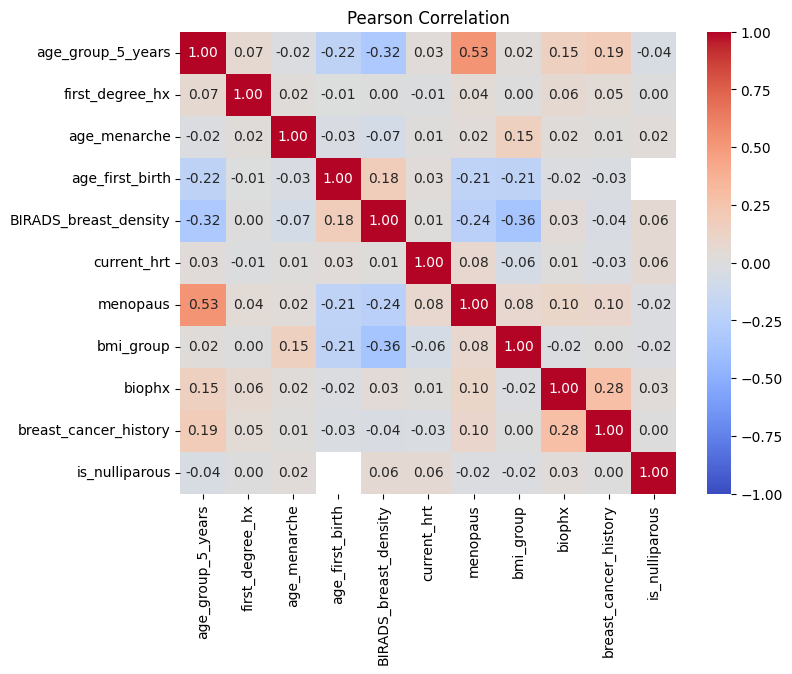

In [ ]:
excluded = (
    'Non-Hispanic black',
    'Asian/Pacific Islander',
    'Native American',
    'Hispanic',
    'Other/mixed'
)

cols_for_corr = [
    col for col in df_encoded.columns
    if not col.startswith(excluded)
]

corr_mat = df_encoded[cols_for_corr].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_mat, vmin=-1, vmax=1, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Pearson Correlation")
plt.show()

# XGBoost

**Filling the missing values with the median of the column, and balancing the classes with the downsampling method.**

In [ ]:
# Convert target to int
df_encoded['breast_cancer_history'] = df_encoded['breast_cancer_history'].astype(int)

# Fill only 'age_first_birth' nulls with median
df_encoded['age_first_birth'] = df_encoded['age_first_birth'].fillna(df_encoded['age_first_birth'].median())

# Downsample to balance classes
class_0 = df_encoded[df_encoded['breast_cancer_history'] == 0]
class_1 = df_encoded[df_encoded['breast_cancer_history'] == 1]
class_0_downsampled = class_0.sample(n=len(class_1), random_state=42)
balanced_df = pd.concat([class_0_downsampled, class_1], axis=0).sample(frac=1, random_state=42).reset_index(drop=True)

print(balanced_df['breast_cancer_history'].value_counts())


breast_cancer_history
0    85862
1    85862
Name: count, dtype: int64


**Splitting the data into train and test set. Then defining hyperparameter grid for choosing the best combination of hyperparameters. Fitting the model and checking the evaluation metrics.**

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters: {'subsample': 1.0, 'scale_pos_weight': 1.1999825302081817, 'reg_lambda': 1, 'reg_alpha': 0.5, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.05, 'gamma': 0.1, 'colsample_bytree': 0.9}
Best recall during tuning: 0.8284903188237006
Default Threshold (0.5):
              precision    recall  f1-score   support

           0       0.81      0.70      0.75     17173
           1       0.74      0.83      0.78     17172

    accuracy                           0.77     34345
   macro avg       0.77      0.77      0.77     34345
weighted avg       0.77      0.77      0.77     34345

AUC: 0.8389380328621374

Optimal Threshold: 0.4938
              precision    recall  f1-score   support

           0       0.81      0.70      0.75     17173
           1       0.73      0.84      0.78     17172

    accuracy                           0.77     34345
   macro avg       0.77      0.77      0.77     34345
weighte

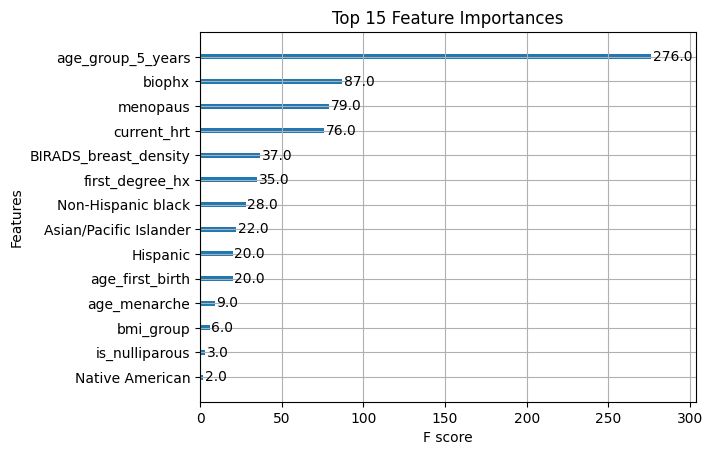

In [ ]:
# Features and target
X = balanced_df.drop(columns=['breast_cancer_history'])
y = balanced_df['breast_cancer_history']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

# Calculate scale_pos_weight
scale_pos_weight = np.sum(y_train == 0) / np.sum(y_train == 1)

# Define base model
xgb_base = XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    random_state=42
)

# Hyperparameter grid
param_grid = {
    'n_estimators': [100, 300, 500, 700],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.02, 0.03, 0.05],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3],
    'reg_alpha': [0, 0.5, 1, 2],
    'reg_lambda': [0.5, 1, 1.5, 2],
    'scale_pos_weight': [scale_pos_weight * 0.8, scale_pos_weight, scale_pos_weight * 1.2]
}

# Randomized search
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
random_search = RandomizedSearchCV(
    estimator=xgb_base,
    param_distributions=param_grid,
    n_iter=20,
    scoring='recall',
    n_jobs=-1,
    cv=cv,
    verbose=1,
    random_state=42
)

# Fit search
random_search.fit(X_train, y_train)
best_model = random_search.best_estimator_

print("Best parameters:", random_search.best_params_)
print("Best recall during tuning:", random_search.best_score_)

# Final predictions
y_pred_proba = best_model.predict_proba(X_test)[:, 1]
y_pred = best_model.predict(X_test)

print("Default Threshold (0.5):")
print(classification_report(y_test, y_pred))
print("AUC:", roc_auc_score(y_test, y_pred_proba))

# Adjust threshold using F1
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
f1_scores = 2 * precision * recall / (precision + recall + 1e-10)
optimal_idx = np.argmax(f1_scores)

if len(thresholds) > 0:
    optimal_threshold = thresholds[optimal_idx]
    y_pred_adjusted = (y_pred_proba >= optimal_threshold).astype(int)
else:
    optimal_threshold = 0.5
    y_pred_adjusted = (y_pred_proba >= 0.5).astype(int)

print(f"\nOptimal Threshold: {optimal_threshold:.4f}")
print(classification_report(y_test, y_pred_adjusted))
print("AUC:", roc_auc_score(y_test, y_pred_proba))

# Feature importance
plot_importance(best_model, max_num_features=15)
plt.title("Top 15 Feature Importances")
plt.show()

**Initializing the SHAP TreeExplainer**

In [ ]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)

**Plotting the average impact of features given by SHAP.**

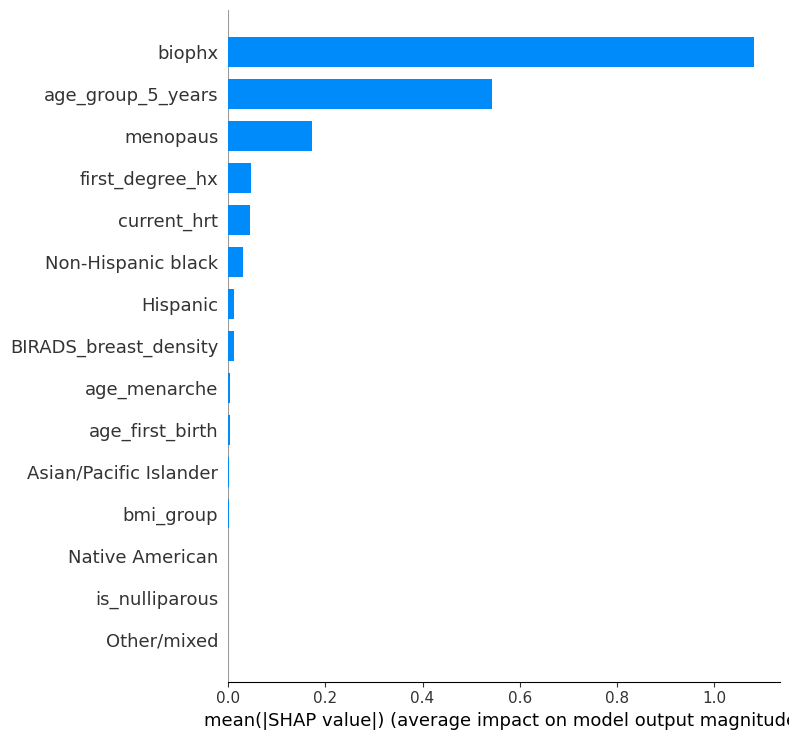

In [ ]:
plt.figure(figsize=(10, 10))
shap.summary_plot(shap_values, X_test, plot_type="bar", show=True)


**Plotting the global explainability of SHAP method on XGBoost.**





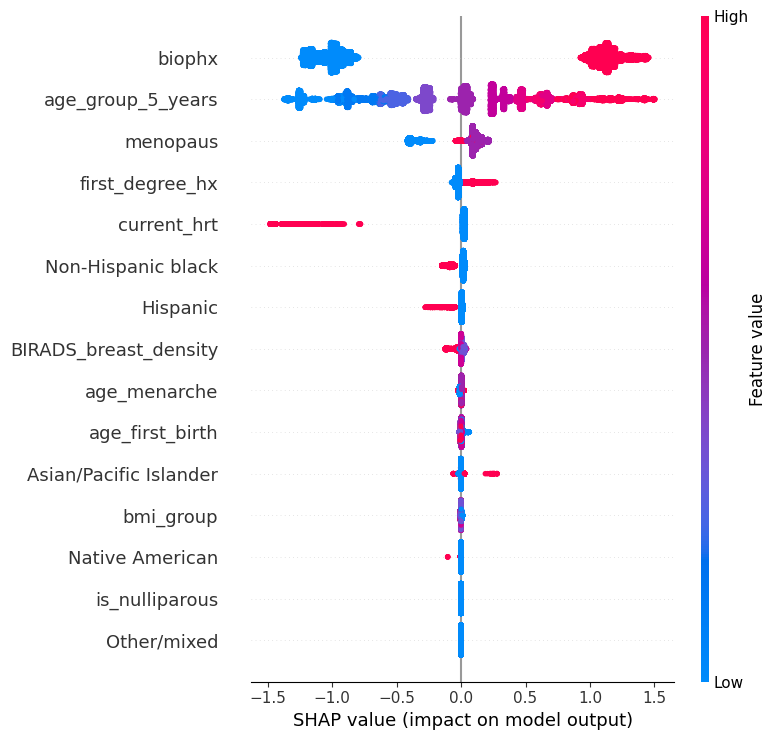

In [ ]:
shap.summary_plot(shap_values, X_test, show=True)

**Plotting the local explainability of SHAP method on XGBoost.**




In [ ]:
shap.initjs()

sample_idx = 0
shap.plots.force(
    explainer.expected_value,
    shap_values[sample_idx],
    X_test.iloc[sample_idx]
)


# ANN

In [ ]:
!pip install innvestigate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 840.9/840.9 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 94.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 489.9/489.9 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 39.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 52.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 70.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 24.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 5.4 MB/s eta 0:00:00
  Created wheel for future: filename=future-0.18.3-py3-none-any.whl size=492025 sha256=bc6

**The code includes preprocessing steps like sampling, imputation, scaling, and SMOTE for class balancing. A dropout-regularized ANN is trained on the processed data, and predictions are evaluated using precision-recall metrics and AUC to select an optimal threshold for classification.**

In [ ]:
#Sampling 50,000 records from the encoded dataset for efficient training.
df_sampled = df_encoded.sample(n=50000, random_state=42)

#Ensuring the target column is of integer type for binary classification.
df_sampled['breast_cancer_history'] = df_sampled['breast_cancer_history'].astype(int)

#Separating the features and target variable.
X = df_sampled.drop(columns='breast_cancer_history')
y = df_sampled['breast_cancer_history']

#Splitting the dataset into training and test sets (80% train, 20% test).
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

#Handling missing values using mean imputation.
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

#Standardizing the features to have zero mean and unit variance.
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_imputed)
X_test_scaled = scaler.transform(X_test_imputed)

#Balancing the dataset using SMOTE to oversample the minority class.
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train_scaled, y_train)

#Define a Sequential ANN model with dropout for regularization.
model = Sequential([
    Dense(64, activation='relu', input_shape=(X_train_res.shape[1],)),
    Dropout(0.3),
    Dense(32, activation='relu'),
    Dropout(0.3),
    Dense(1, activation='sigmoid')
])

#Train the model with validation split to monitor generalization.
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history = model.fit(X_train_res, y_train_res, epochs=30, batch_size=32, validation_split=0.2, verbose=1)

#Predicting probabilities on the test set.
y_pred_proba = model.predict(X_test_scaled).ravel()

#Computing precision-recall pairs for various thresholds.
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)

#Selecting an appropriate threshold to maximize recall.
valid_idxs = np.where((recall > 0.65) & (precision > 0.15))[0]
optimal_threshold = thresholds[valid_idxs[np.argmax(recall[valid_idxs])]] if len(valid_idxs) > 0 else 0.4

#Applying selected threshold to generate final binary predictions.
y_pred_adjusted = (y_pred_proba >= optimal_threshold).astype(int)

#Printing the evaluation metrics.
print(f"\nSelected Threshold: {optimal_threshold:.4f}")
print(classification_report(y_test, y_pred_adjusted))
print("AUC:", roc_auc_score(y_test, y_pred_proba))


Train on 59940 samples, validate on 14986 samples
Epoch 1/30
59808/59940 [============================>.] - ETA: 0s - loss: 0.4873 - accuracy: 0.7634

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates


59940/59940 [==============================] - 7s 113us/sample - loss: 0.4872 - accuracy: 0.7635 - val_loss: 0.6559 - val_accuracy: 0.7103
Epoch 2/30
59940/59940 [==============================] - 5s 82us/sample - loss: 0.4684 - accuracy: 0.7745 - val_loss: 0.6265 - val_accuracy: 0.7172
Epoch 3/30
59940/59940 [==============================] - 4s 65us/sample - loss: 0.4634 - accuracy: 0.7763 - val_loss: 0.6250 - val_accuracy: 0.7106
Epoch 4/30
59940/59940 [==============================] - 4s 64us/sample - loss: 0.4616 - accuracy: 0.7787 - val_loss: 0.6409 - val_accuracy: 0.6979
Epoch 5/30
59940/59940 [==============================] - 5s 83us/sample - loss: 0.4589 - accuracy: 0.7800 - val_loss: 0.6003 - val_accuracy: 0.7276
Epoch 6/30
59940/59940 [==============================] - 4s 65us/sample - loss: 0.4569 - accuracy: 0.7819 - val_loss: 0.5977 - val_accuracy: 0.7299
Epoch 7/30
59940/59940 [==============================] - 4s 66us/sample - loss: 0.4563 - accuracy: 0.7824 - val_los

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,



Selected Threshold: 0.3218
              precision    recall  f1-score   support

           0       0.98      0.69      0.81      9366
           1       0.15      0.82      0.25       634

    accuracy                           0.69     10000
   macro avg       0.57      0.75      0.53     10000
weighted avg       0.93      0.69      0.77     10000

AUC: 0.8195852876805897


**This code applies Layer-wise Relevance Propagation (LRP) to interpret predictions of the trained ANN model for breast cancer detection. It removes the final activation layer to access raw model outputs, creates an LRP analyzer using the innvestigate library, and computes feature-wise relevance scores for a small batch of test data. The relevance for a selected sample is visualized, helping to identify which input features contributed most to the model's decision.**

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,


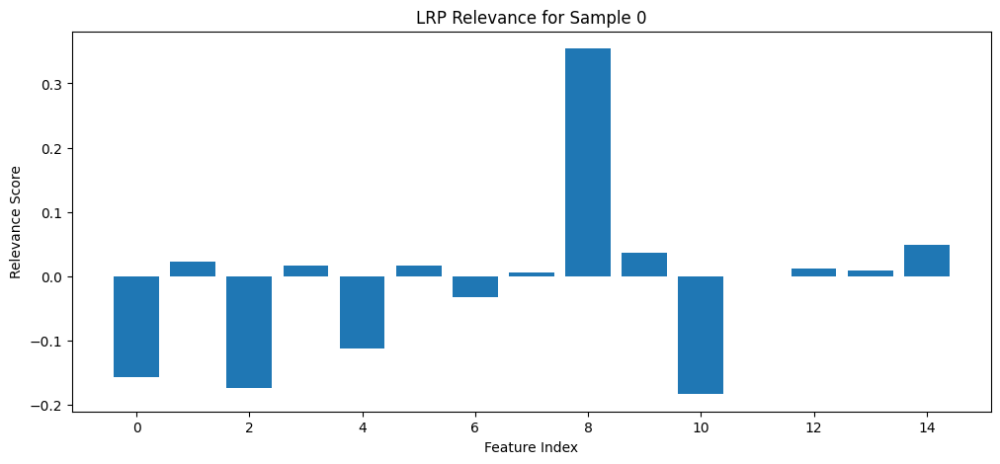

In [ ]:
import innvestigate
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras import Model

#Removing the activation from the last layer.
model_wo_activation = Model(inputs=model.input, outputs=model.layers[-1].input)

#Picking a batch of test data.
X_test_batch = X_test_scaled[:10]

#Creating the LRP analyzer.
analyzer = innvestigate.create_analyzer("lrp.epsilon", model_wo_activation)

#Computing relevance scores.
relevance_scores = analyzer.analyze(X_test_batch)

#Plotting relevance for one instance of a test sample.
sample_idx = 0
plt.figure(figsize=(12, 5))
plt.bar(range(X_test_scaled.shape[1]), relevance_scores[sample_idx])
plt.xlabel("Feature Index")
plt.ylabel("Relevance Score")
plt.title(f"LRP Relevance for Sample {sample_idx}")
plt.show()



# SVM

**This code splits the dataset into training (60%), validation (20%), and test (20%) sets using stratification to preserve class distribution. Then, it applies stratified sampling to select 50,000 representative training samples, ensuring balanced class proportions for model training.**

In [ ]:
# Feature-target split
X = df_encoded.drop(columns='breast_cancer_history')
y = df_encoded['breast_cancer_history']

# Split: 60% Train, 20% Val, 20% Test (with stratification)
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.4, stratify=y, random_state=42)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, stratify=y_temp, random_state=42)

# Stratified sampling from training data
sample_size = 50000

sss = StratifiedShuffleSplit(n_splits=1, train_size=sample_size, random_state=42)
for idx, _ in sss.split(X_train, y_train):
    X_sampled = X_train.iloc[idx]
    y_sampled = y_train.iloc[idx]

In [ ]:
# Scale only numeric columns in train, val, test sets
scale_cols = [
    'age_group_5_years',
    'age_menarche',
    'age_first_birth',
    'bmi_group',
    'BIRADS_breast_density'
]

scaler = StandardScaler()

X_sampled_scaled = X_sampled.copy()
X_val_scaled = X_val.copy()
X_test_scaled = X_test.copy()

X_sampled_scaled[scale_cols] = scaler.fit_transform(X_sampled[scale_cols])
X_val_scaled[scale_cols] = scaler.transform(X_val[scale_cols])
X_test_scaled[scale_cols] = scaler.transform(X_test[scale_cols])


In [ ]:
# Fit SVM
svm_model = SVC(
    kernel='rbf',
    class_weight='balanced',
    probability=True,
    random_state=42
)

svm_model.fit(X_sampled_scaled, y_sampled)

SVC(class_weight='balanced', probability=True, random_state=42)

In [ ]:
# Evaluate on validation set
y_val_probs = svm_model.predict_proba(X_val_scaled)[:, 1]
y_val_pred = (y_val_probs >= 0.05).astype(int)

print("Classification Report (Validation Set):")
print(classification_report(y_val, y_val_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_val, y_val_pred))

print("ROC AUC Score:")
print(roc_auc_score(y_val, y_val_probs))

Classification Report (Validation Set):
              precision    recall  f1-score   support

           0       0.98      0.75      0.85    260551
           1       0.17      0.78      0.28     17172

    accuracy                           0.75    277723
   macro avg       0.58      0.77      0.56    277723
weighted avg       0.93      0.75      0.81    277723

Confusion Matrix:
[[195031  65520]
 [  3694  13478]]
ROC AUC Score:
0.8211543544100783


**This function generates a LIME explanation for a given validation sample (specified by idx). It explains the prediction made by the svm_model by highlighting the top 10 features influencing the decision and displays the result in a notebook-friendly format.**

In [ ]:
def explain_random_or_index(idx):
    explanation = explainer.explain_instance(
        X_val_scaled.iloc[idx].values,
        svm_model.predict_proba,
        num_features=10
    )
    explanation.show_in_notebook()
    return explanation


In [ ]:
exp = explain_random_or_index(7)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


**This code evaluates the SVM model's performance on the test set using a low decision threshold of 0.05, which increases sensitivity (recall) by predicting more positives.**

In [ ]:
y_test_probs = svm_model.predict_proba(X_test_scaled)[:, 1]

threshold = 0.05
y_test_pred = (y_test_probs >= threshold).astype(int)

print("Classification Report (Test Set):")
print(classification_report(y_test, y_test_pred))

print("Confusion Matrix (Test Set):")
print(confusion_matrix(y_test, y_test_pred))

print("ROC AUC Score (Test Set):")
print(roc_auc_score(y_test, y_test_probs))

Classification Report (Test Set):
              precision    recall  f1-score   support

           0       0.98      0.75      0.85    260551
           1       0.17      0.78      0.28     17173

    accuracy                           0.75    277724
   macro avg       0.58      0.77      0.56    277724
weighted avg       0.93      0.75      0.81    277724

Confusion Matrix (Test Set):
[[194966  65585]
 [  3708  13465]]
ROC AUC Score (Test Set):
0.8183769501681427


In [ ]:
for threshold in [0.1, 0.15, 0.2]:
    y_pred_thresh = (y_test_probs >= threshold).astype(int)

    print(f"\n Threshold: {threshold}")
    print(classification_report(y_test, y_pred_thresh, digits=2))

    auc = roc_auc_score(y_test, y_test_probs)
    print(f"ROC AUC Score (probability-based): {auc:.4f}")


 Threshold: 0.1
              precision    recall  f1-score   support

           0       0.98      0.79      0.87    260551
           1       0.19      0.73      0.30     17173

    accuracy                           0.79    277724
   macro avg       0.58      0.76      0.59    277724
weighted avg       0.93      0.79      0.84    277724

ROC AUC Score (probability-based): 0.8184

 Threshold: 0.15
              precision    recall  f1-score   support

           0       0.97      0.82      0.89    260551
           1       0.20      0.68      0.31     17173

    accuracy                           0.81    277724
   macro avg       0.59      0.75      0.60    277724
weighted avg       0.93      0.81      0.86    277724

ROC AUC Score (probability-based): 0.8184

 Threshold: 0.2
              precision    recall  f1-score   support

           0       0.97      0.88      0.92    260551
           1       0.23      0.52      0.32     17173

    accuracy                           0.86   

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_sampled_scaled.values,
    feature_names=X_sampled.columns,
    class_names=['No Cancer', 'Prior Cancer'],
    mode='classification'
)

# Pick a validation sample that was predicted as class 1
idx = np.where(y_val_pred == 1)[0][0]
lime_exp = explainer.explain_instance(
    X_val_scaled.iloc[idx].values,
    svm_model.predict_proba,
    num_features=10
)

lime_exp.show_in_notebook()

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


In [ ]:
# Get probabilities and predictions (at tuned threshold)
y_val_probs = svm_model.predict_proba(X_val_scaled)[:, 1]
y_val_pred = (y_val_probs >= 0.15).astype(int)

# Create DataFrame with all needed info
val_results = pd.DataFrame({
    'true': y_val.values,
    'pred': y_val_pred,
    'prob': y_val_probs
})

# Add mask for each case
val_results['type'] = np.select(
    [
        (val_results['true'] == 1) & (val_results['pred'] == 1),  # True Positive
        (val_results['true'] == 0) & (val_results['pred'] == 1),  # False Positive
        (val_results['true'] == 1) & (val_results['pred'] == 0),  # False Negative
        (val_results['true'] == 0) & (val_results['pred'] == 0)   # True Negative
    ],
    ['TP', 'FP', 'FN', 'TN'],
    default='Unknown'
)

val_results.head()

,true,pred,prob,type
0,0,0,0.001128,TN
1,0,0,0.015558,TN
2,0,0,0.039449,TN
3,0,0,0.012134,TN
4,1,1,0.209111,TP


from matplotlib import pyplot as plt
_df_0['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['true'].plot(kind='hist', bins=20, title='true')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['pred'].plot(kind='hist', bins=20, title='pred')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['prob'].plot(kind='hist', bins=20, title='prob')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_4.groupby('type').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='index', y='true', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='true', y='pred', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='pred', y='prob', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['prob']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_8.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('type')):
  _plot_series(series, series_name, i)
  fig.legend(title='type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('prob')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['index']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'index'}, axis=1)
              .sort_values('index', ascending=True))
  xs = counted['index']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_9.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('type')):
  _plot_series(series, series_name, i)
  fig.legend(title='type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['true']
  ys = series['prob']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_10.sort_values('true', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('type')):
  _plot_series(series, series_name, i)
  fig.legend(title='type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('true')
_ = plt.ylabel('prob')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['true']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'true'}, axis=1)
              .sort_values('true', ascending=True))
  xs = counted['true']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_11.sort_values('true', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('type')):
  _plot_series(series, series_name, i)
  fig.legend(title='type', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('true')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_12['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_13['true'].plot(kind='line', figsize=(8, 4), title='true')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_14['pred'].plot(kind='line', figsize=(8, 4), title='pred')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_15['prob'].plot(kind='line', figsize=(8, 4), title='prob')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_16['type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_16, x='index', y='type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_17['type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_17, x='true', y='type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_18['type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_18, x='pred', y='type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_19['type'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_19, x='prob', y='type', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:

# Create explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_sampled_scaled.values,
    feature_names=X_sampled.columns.tolist(),
    class_names=['No Cancer', 'Prior Cancer'],
    mode='classification'
)

# Helper function
def explain_lime_for_case(case_type, idx_in_type=None):
    idxs = val_results[val_results['type'] == case_type].index
    if len(idxs) == 0:
        print(f"No {case_type} examples found.")
        return None

    idx = idxs[idx_in_type or 0]  # Default to first match

    # Run LIME
    explanation = explainer.explain_instance(
        X_val_scaled.iloc[idx].values,
        svm_model.predict_proba,
        num_features=10
    )

    # Show in notebook
    explanation.show_in_notebook()

    # # Optional: save to PNG
    # fig = explanation.as_pyplot_figure()
    # plt.title(f"LIME Explanation – {case_type}")
    # fig.savefig(f"lime_{case_type}.png", bbox_inches='tight')
    # plt.close(fig)

    return explanation

In [ ]:
explain_lime_for_case("TP")
explain_lime_for_case("FP")
explain_lime_for_case("FN")
explain_lime_for_case("TN")


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


In [ ]:
param_grid = {
    'C': [0.1, 1, 10],               # Try lower and higher penalties
    'gamma': ['scale', 0.1, 1],      # Default and custom gamma values
}

svc = SVC(
    kernel='rbf',
    class_weight='balanced',
    probability=True,
    random_state=42
)

grid = GridSearchCV(
    estimator=svc,
    param_grid=param_grid,
    scoring='f1',  # or 'recall' to focus more on class 1 sensitivity
    cv=3,          # 3-fold cross-validation
    verbose=2,
    n_jobs=-1      # use all cores if running locally
)

# Fit on your scaled sample
grid.fit(X_sampled_scaled, y_sampled)

Fitting 3 folds for each of 9 candidates, totalling 27 fits


In [ ]:
print("Best parameters:", grid.best_params_)
print("Best F1 score from CV:", grid.best_score_)


In [ ]:
best_svm = grid.best_estimator_

# Predict probabilities and apply your threshold
y_val_probs = best_svm.predict_proba(X_val_scaled)[:, 1]
y_val_pred = (y_val_probs >= 0.15).astype(int)

# Evaluate
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_val, y_val_pred))
print(confusion_matrix(y_val, y_val_pred))


In [ ]:

# Compute class weights based on your current training labels
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.array([0, 1]),
    y=y_sampled
)

# Convert to a usable dictionary
class_weight_dict = dict(zip([0, 1], class_weights))
print("Computed class weights:", class_weight_dict)

Dempster-Shaffer Method

**This code prepares a balanced dataset and initializes a set of human-readable rules with Mass Assignment Functions (MAFs) for use in interpretable models or expert systems. Here's a compact summary**

In [ ]:
# Convert target to int
df_encoded['breast_cancer_history'] = df_encoded['breast_cancer_history'].astype(int)

# Fill only 'age_first_birth' nulls with median
df_encoded['age_first_birth'] = df_encoded['age_first_birth'].fillna(df_encoded['age_first_birth'].median())

# Downsample to balance classes
class_0 = df_encoded[df_encoded['breast_cancer_history'] == 0]
class_1 = df_encoded[df_encoded['breast_cancer_history'] == 1]
class_0_downsampled = class_0.sample(n=len(class_1), random_state=42)
balanced_df = pd.concat([class_0_downsampled, class_1], axis=0).sample(frac=1, random_state=42).reset_index(drop=True)

# Drop the target from the feature list
target_col = "breast_cancer_history"
feature_cols = [col for col in balanced_df.columns if col != target_col]

# Create a list to store rules
rules = []

# Parameters for MAF initialization
def init_maf():
    # Assign high uncertainty, low knowledge
    m_no = np.random.uniform(0.01, 0.05)
    m_yes = np.random.uniform(0.01, 0.05)
    m_unc = 1.0 - m_no - m_yes
    return {"No_History": m_no, "History": m_yes, "Uncertainty": m_unc}

# Generate rules
for col in feature_cols:
    unique_vals = balanced_df[col].unique()

    # For numeric/categorical columns
    for val in sorted(unique_vals):
        rule = {
            "feature": col,
            "operator": "==",
            "value": val,
            "predicate": lambda x, col=col, val=val: x[col] == val,
            "MAF": init_maf()
        }
        rules.append(rule)

# Show some example rules
for r in rules[:]:
    print(f"If {r['feature']} {r['operator']} {r['value']} -> MAF: {r['MAF']}")

If age_group_5_years == 1 -> MAF: {'No_History': 0.04900678971756918, 'History': 0.04427337259094299, 'Uncertainty': 0.9067198376914878}
If age_group_5_years == 2 -> MAF: {'No_History': 0.04255121609449058, 'History': 0.03521178599505212, 'Uncertainty': 0.9222369979104573}
If age_group_5_years == 3 -> MAF: {'No_History': 0.026266252857160735, 'History': 0.01157231651346761, 'Uncertainty': 0.9621614306293717}
If age_group_5_years == 4 -> MAF: {'No_History': 0.03701970773038062, 'History': 0.027234285199305458, 'Uncertainty': 0.9357460070703139}
If age_group_5_years == 5 -> MAF: {'No_History': 0.010740808370058606, 'History': 0.020717145227321883, 'Uncertainty': 0.9685420464026194}
If age_group_5_years == 6 -> MAF: {'No_History': 0.03077512492331841, 'History': 0.04142284790687845, 'Uncertainty': 0.9278020271698032}
If age_group_5_years == 7 -> MAF: {'No_History': 0.037031489544619135, 'History': 0.019482870137346564, 'Uncertainty': 0.9434856403180343}
If age_group_5_years == 8 -> MAF: {

In [ ]:
def combine_two_mafs(m1, m2):
    # m1 and m2 are dictionaries with keys: "No_History", "History", "Uncertainty"
    m_comb = {}
    k_conflict = (
        m1["No_History"] * m2["History"] + m1["History"] * m2["No_History"]
    )
    norm = 1.0 / (1.0 - k_conflict) if k_conflict < 1.0 else 1e-6

    m_comb["No_History"] = norm * (
        m1["No_History"] * m2["No_History"] +
        m1["No_History"] * m2["Uncertainty"] +
        m1["Uncertainty"] * m2["No_History"]
    )
    m_comb["History"] = norm * (
        m1["History"] * m2["History"] +
        m1["History"] * m2["Uncertainty"] +
        m1["Uncertainty"] * m2["History"]
    )
    m_comb["Uncertainty"] = norm * (m1["Uncertainty"] * m2["Uncertainty"])

    return m_comb

In [ ]:
def classify_sample(sample, rules):
    applicable_mafs = []

    for rule in rules:
        if rule["predicate"](sample):
            applicable_mafs.append(rule["MAF"])

    if not applicable_mafs:
        return None  # no rule fired

    # Combine MAFs using Dempster’s rule
    combined = applicable_mafs[0]
    for m in applicable_mafs[1:]:
        combined = combine_two_mafs(combined, m)

    return combined

In [ ]:
def mse_loss(pred_belief, true_label):
    y_true = {"No_History": 1.0, "History": 0.0} if true_label == 0 else {"No_History": 0.0, "History": 1.0}
    return (pred_belief["No_History"] - y_true["No_History"])**2 + \
           (pred_belief["History"] - y_true["History"])**2

def normalize_maf(maf):
    # Project to valid simplex
    for key in ["No_History", "History", "Uncertainty"]:
        maf[key] = max(min(maf[key], 1), 0)
    total = sum(maf.values())
    for key in maf:
        maf[key] /= total
    return maf

def train_one_epoch(df, rules, learning_rate=0.01):
    for idx, row in df.iterrows():
        sample = row
        y_true = row["breast_cancer_history"]

        # Collect firing rules
        active_rules = [r for r in rules if r["predicate"](sample)]

        if not active_rules:
            continue

        # Forward pass: combine MAFs
        mafs = [r["MAF"] for r in active_rules]
        combined = mafs[0]
        for m in mafs[1:]:
            combined = combine_two_mafs(combined, m)

        # Compute gradients (approximate, not exact DST gradients)
        loss = mse_loss(combined, y_true)
        grad = {
            "No_History": 2 * (combined["No_History"] - (1.0 if y_true == 0 else 0.0)),
            "History": 2 * (combined["History"] - (1.0 if y_true == 1 else 0.0)),
        }

        # Backward pass: apply to each active rule’s MAF
        for r in active_rules:
            r["MAF"]["No_History"] -= learning_rate * grad["No_History"]
            r["MAF"]["History"] -= learning_rate * grad["History"]
            r["MAF"]["Uncertainty"] = 1.0 - r["MAF"]["No_History"] - r["MAF"]["History"]
            r["MAF"] = normalize_maf(r["MAF"])


In [ ]:
for epoch in range(10):
    train_one_epoch(balanced_df, rules, learning_rate=0.01)
    print(f"Epoch {epoch + 1} complete")


Epoch 1 complete
Epoch 2 complete
Epoch 3 complete
Epoch 4 complete
Epoch 5 complete
Epoch 6 complete
Epoch 7 complete
Epoch 8 complete
Epoch 9 complete
Epoch 10 complete


In [ ]:
def predict_label_from_belief(belief):
    if belief is None:
        return 0  # fallback to majority class or neutral
    return 1 if belief["History"] > belief["No_History"] else 0

In [ ]:
def evaluate_model(df, rules):
    y_true = []
    y_pred = []
    y_scores = []  # for ROC AUC

    for idx, row in df.iterrows():
        belief = classify_sample(row, rules)
        label = predict_label_from_belief(belief)

        y_true.append(row["breast_cancer_history"])
        y_pred.append(label)

        # Use belief in "History" as confidence score
        y_scores.append(belief["History"] if belief else 0.5)

    acc = accuracy_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_scores)
    f1 = f1_score(y_true, y_pred)

    print(f"Accuracy     : {acc:.4f}")
    print(f"ROC AUC      : {auc:.4f}")
    print(f"F1 Score     : {f1:.4f}")

    return acc, auc, f1

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score
acc, auc, f1 = evaluate_model(balanced_df, rules)

Accuracy     : 0.7596
ROC AUC      : 0.8318
F1 Score     : 0.7707


In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def plot_confusion(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                                   display_labels=["No History", "History"])
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()


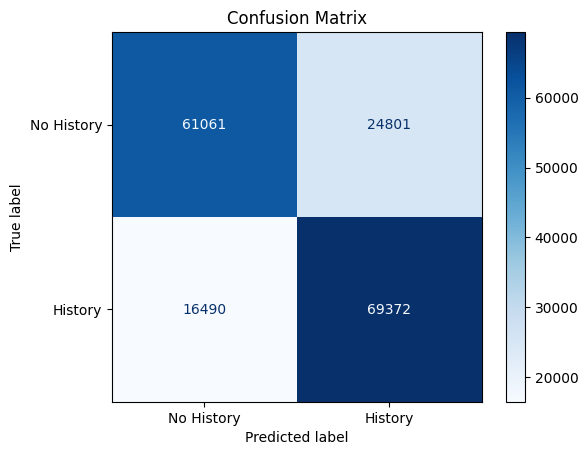

In [ ]:
y_true = balanced_df["breast_cancer_history"]
y_pred = [predict_label_from_belief(classify_sample(row, rules)) for idx, row in balanced_df.iterrows()]
plot_confusion(y_true, y_pred)

In [ ]:
from sklearn.metrics import roc_curve, auc

def plot_roc(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)

    plt.figure()
    plt.plot(fpr, tpr, color="darkorange", lw=2, label=f"ROC curve (AUC = {roc_auc:.2f})")
    plt.plot([0, 1], [0, 1], color="navy", lw=2, linestyle="--")
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver Operating Characteristic")
    plt.legend(loc="lower right")
    plt.show()


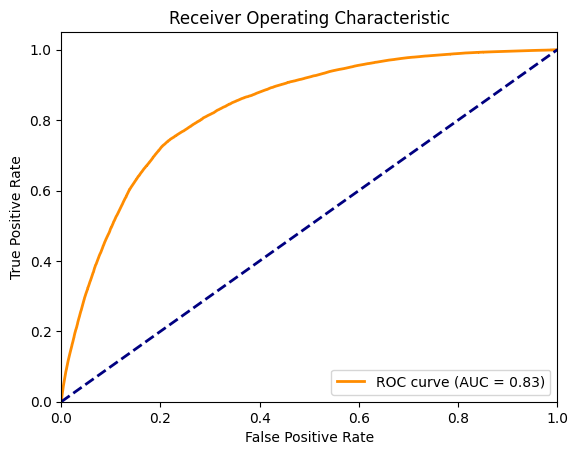

In [ ]:
y_scores = [classify_sample(row, rules)["History"] for idx, row in balanced_df.iterrows()]
plot_roc(y_true, y_scores)

In [ ]:
from sklearn.metrics import precision_recall_curve, average_precision_score

def plot_precision_recall(y_true, y_scores):
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    avg_precision = average_precision_score(y_true, y_scores)

    plt.figure()
    plt.plot(recall, precision, color="blue", lw=2,
             label=f"PR curve (Avg Precision = {avg_precision:.2f})")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curve")
    plt.legend(loc="upper right")
    plt.grid()
    plt.show()


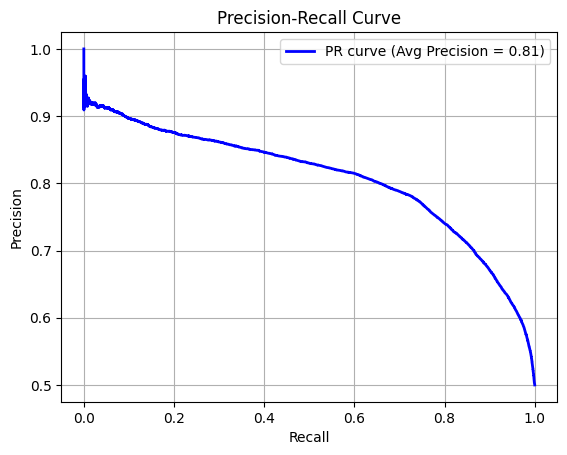

In [ ]:
# y_true: actual labels
# y_scores: belief values assigned to 'History' by the model

y_scores = [classify_sample(row, rules)["History"] for idx, row in balanced_df.iterrows()]
plot_precision_recall(y_true, y_scores)
